# Overview of the BirdCLEF 2023 Dataset
* This EDA notebook provides a comprehensive overview of the BirdCLEF 2023 dataset, including various analyses and visualizations to help understand the data structure and characteristics. The insights gained will be valuable for developing effective audio classification models for this competition.

# Setup and Data Loading
* Let's start by importing necessary libraries and loading the datasets.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import librosa
import librosa.display
import IPython.display as ipd
from pathlib import Path
import random
from collections import Counter

# Set style for plots
plt.style.use('ggplot')
sns.set(style="whitegrid")

# Load the training metadata
train_df = pd.read_csv('train.csv')
taxonomy_df = pd.read_csv('taxonomy.csv')
sample_submission_df = pd.read_csv('sample_submission.csv')

# Display basic information
print(f"Training data shape: {train_df.shape}")
print(f"Taxonomy data shape: {taxonomy_df.shape}")
print(f"Sample submission shape: {sample_submission_df.shape}")

# Display the first few rows of each dataframe
print("\nTraining data sample:")
display(train_df.head())

print("\nTaxonomy data sample:")
display(taxonomy_df.head())

print("\nSample submission format:")
display(sample_submission_df.head(3))

Training data shape: (28564, 13)
Taxonomy data shape: (206, 5)
Sample submission shape: (3, 207)

Training data sample:


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
0,1139490,[''],[''],1139490/CSA36385.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
1,1139490,[''],[''],1139490/CSA36389.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
2,1192948,[''],[''],1192948/CSA36358.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
3,1192948,[''],[''],1192948/CSA36366.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.2800,-73.8582,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
4,1192948,[''],[''],1192948/CSA36373.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0



Taxonomy data sample:


,primary_label,inat_taxon_id,scientific_name,common_name,class_name
0,1139490,1139490,Ragoniella pulchella,Ragoniella pulchella,Insecta
1,1192948,1192948,Oxyprora surinamensis,Oxyprora surinamensis,Insecta
2,1194042,1194042,Copiphora colombiae,Copiphora colombiae,Insecta
3,126247,126247,Leptodactylus insularum,Spotted Foam-nest Frog,Amphibia
4,1346504,1346504,Neoconocephalus brachypterus,Neoconocephalus brachypterus,Insecta



Sample submission format:


,row_id,1139490,1192948,1194042,126247,1346504,134933,135045,1462711,1462737,...,yebfly1,yebsee1,yecspi2,yectyr1,yehbla2,yehcar1,yelori1,yeofly1,yercac1,ywcpar
0,soundscape_8358733_5,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854
1,soundscape_8358733_10,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854
2,soundscape_8358733_15,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854


# Data Overview and Statistics
* Let's examine the structure and basic statistics of our datasets.

In [2]:
# Basic statistics of the training data
print("Training data info:")
train_df.info()

# Check for missing values
print("\nMissing values in training data:")
print(train_df.isnull().sum())

# Overview of the species distribution
print("\nNumber of unique species (primary_label):", train_df['primary_label'].nunique())
print("Number of species in taxonomy:", taxonomy_df['primary_label'].nunique())
print("Number of species in sample submission:", len(sample_submission_df.columns) - 1)  # Subtract 1 for row_id column

# Distribution of species classes
class_distribution = taxonomy_df['class_name'].value_counts()
print("\nDistribution of species classes:")
print(class_distribution)

# Top 10 most common species in the training set
species_counts = train_df['primary_label'].value_counts().head(10)
print("\nTop 10 most common species in the training set:")
print(species_counts)

Training data info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28564 entries, 0 to 28563
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     28564 non-null  object 
 1   secondary_labels  28564 non-null  object 
 2   type              28564 non-null  object 
 3   filename          28564 non-null  object 
 4   collection        28564 non-null  object 
 5   rating            28564 non-null  float64
 6   url               28564 non-null  object 
 7   latitude          27755 non-null  float64
 8   longitude         27755 non-null  float64
 9   scientific_name   28564 non-null  object 
 10  common_name       28564 non-null  object 
 11  author            28564 non-null  object 
 12  license           28564 non-null  object 
dtypes: float64(3), object(10)
memory usage: 2.8+ MB

Missing values in training data:
primary_label         0
secondary_labels      0
type                  0
filenam

# Species Distribution Analysis
* Now, let's visualize the distribution of species and classes.

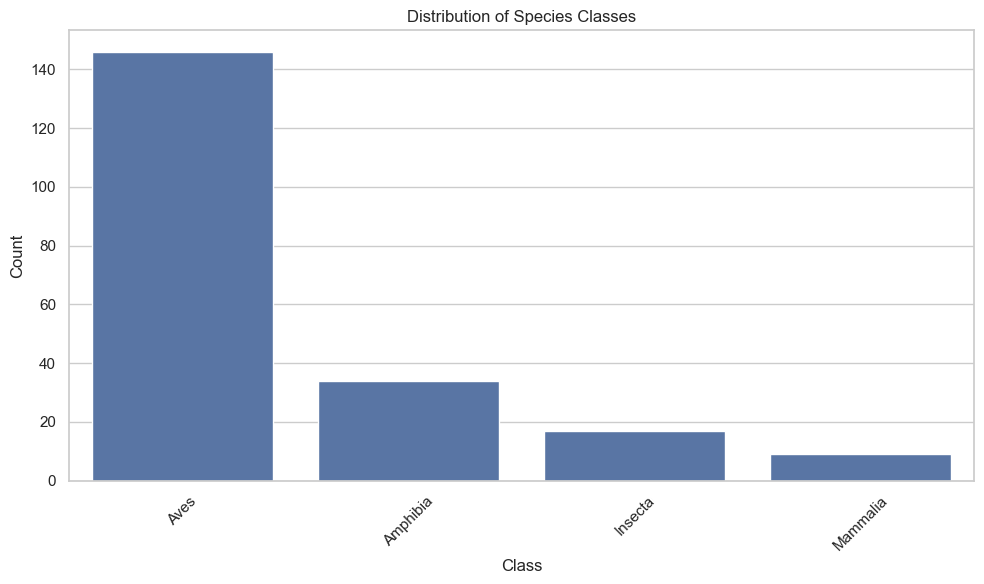

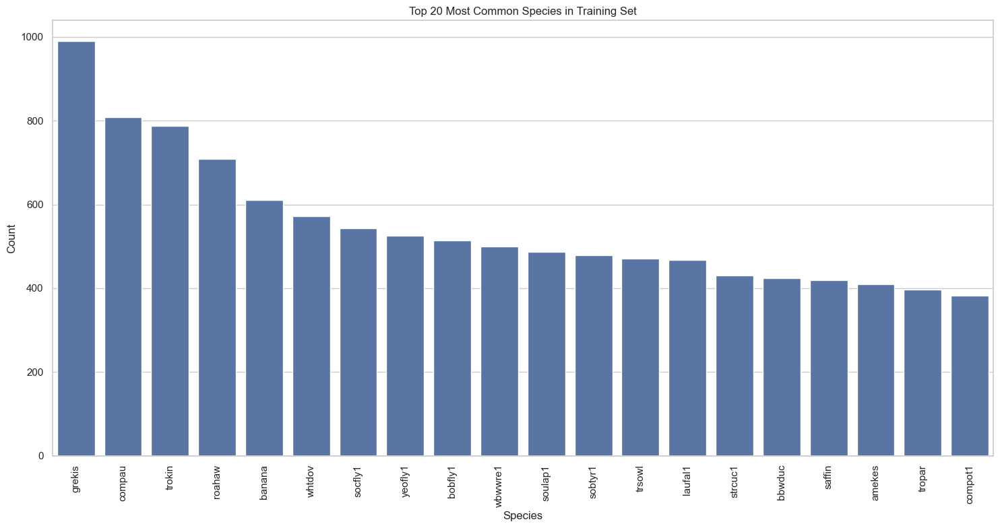

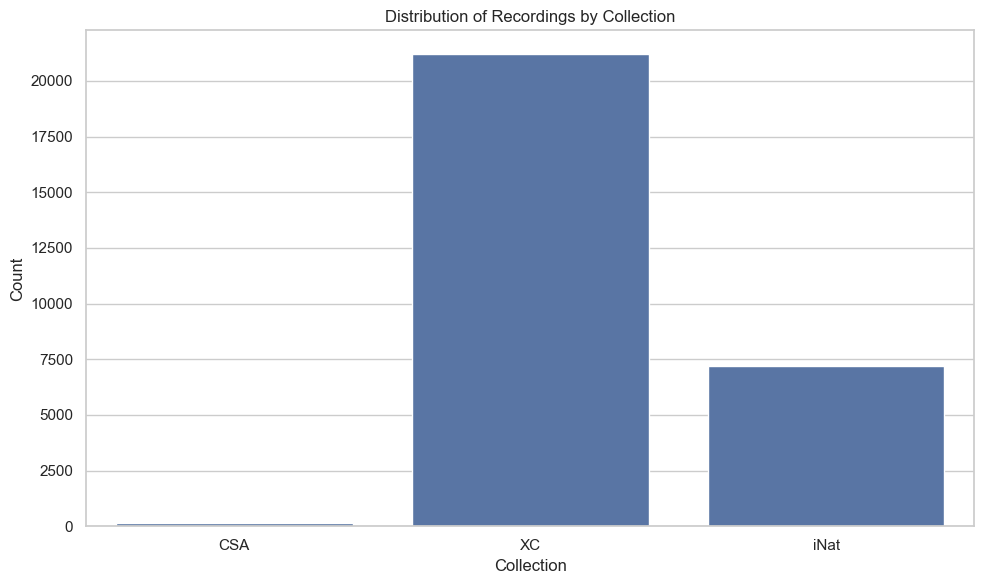

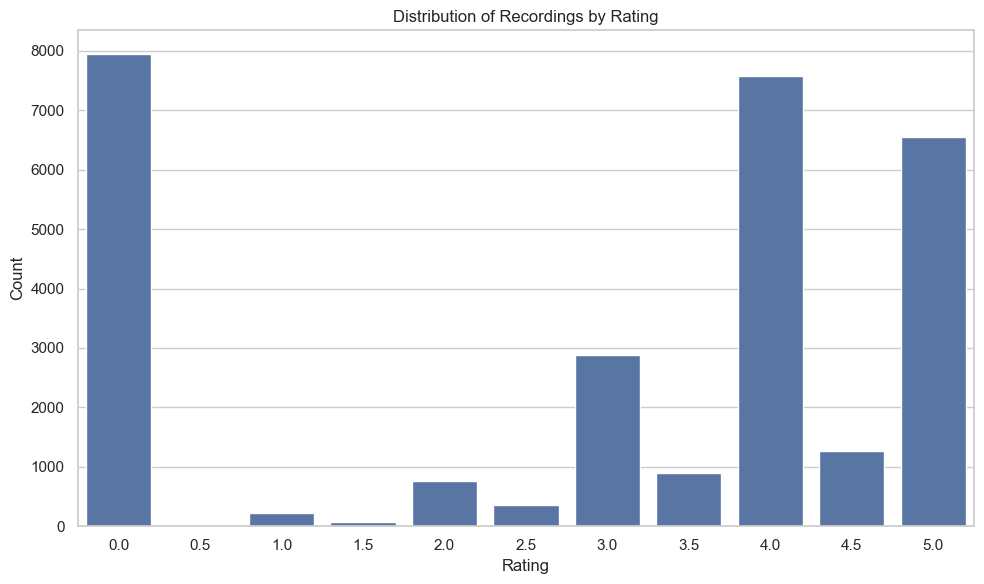

In [4]:
# Plot the distribution of classes
plt.figure(figsize=(10, 6))
sns.barplot(x=class_distribution.index, y=class_distribution.values)
plt.title('Distribution of Species Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot the distribution of top 20 species
plt.figure(figsize=(15, 8))
top_species = train_df['primary_label'].value_counts().head(20)
sns.barplot(x=top_species.index, y=top_species.values)
plt.title('Top 20 Most Common Species in Training Set')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Distribution of recordings by collection
plt.figure(figsize=(10, 6))
sns.countplot(x='collection', data=train_df)
plt.title('Distribution of Recordings by Collection')
plt.xlabel('Collection')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Distribution of recordings by rating
plt.figure(figsize=(10, 6))
sns.countplot(x='rating', data=train_df)
plt.title('Distribution of Recordings by Rating')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Geographic Distribution of Recordings
* Let's analyze the geographic distribution of our recordings.

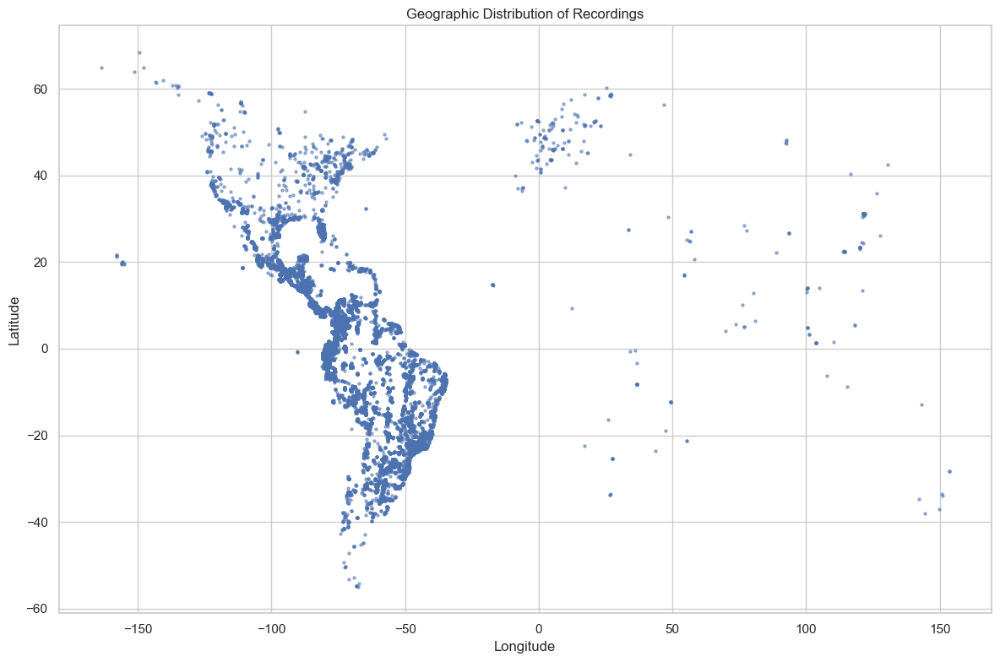

Information about the recording location:
Nature reserve "El Silencio" in the municipality of YondÃ³ in the Middle Magdalena Valley of Colombia.

Website: https://www.fundacionbiodiversa.org/fundacion2024/information/  

Coordinates:

Latitude: 6.76
Longitude: -74.21


In [6]:
# Filter out recordings with missing coordinates
geo_df = train_df.dropna(subset=['latitude', 'longitude'])

# Plot the geographic distribution of recordings
plt.figure(figsize=(12, 8))
plt.scatter(geo_df['longitude'], geo_df['latitude'], alpha=0.5, s=5)
plt.title('Geographic Distribution of Recordings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.tight_layout()
plt.show()

# Get specific information about the recording location from the text file
with open('recording_location.txt', 'r') as f:
    location_info = f.read()
    
print("Information about the recording location:")
print(location_info)

# Audio Analysis
* Let's examine the audio characteristics by loading and visualizing a few examples.


Visualizing audio for class: Insecta
Audio duration: 115.72 seconds, Sample rate: 32000 Hz
Audio player:



Visualizing audio for class: Amphibia
Audio duration: 9.98 seconds, Sample rate: 32000 Hz
Audio player:



Visualizing audio for class: Mammalia
Audio duration: 41.61 seconds, Sample rate: 32000 Hz
Audio player:



Visualizing audio for class: Aves
Audio duration: 20.30 seconds, Sample rate: 32000 Hz
Audio player:


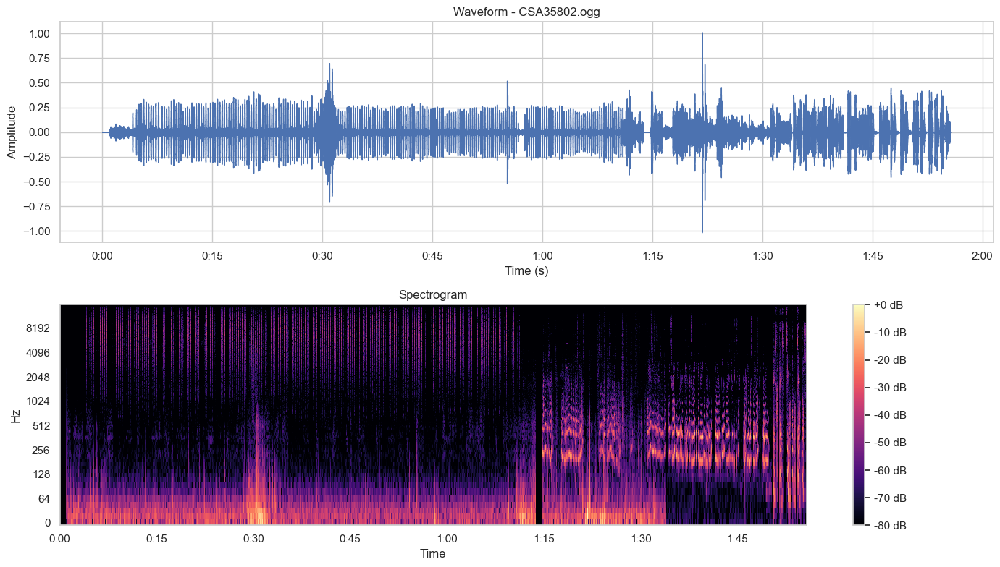

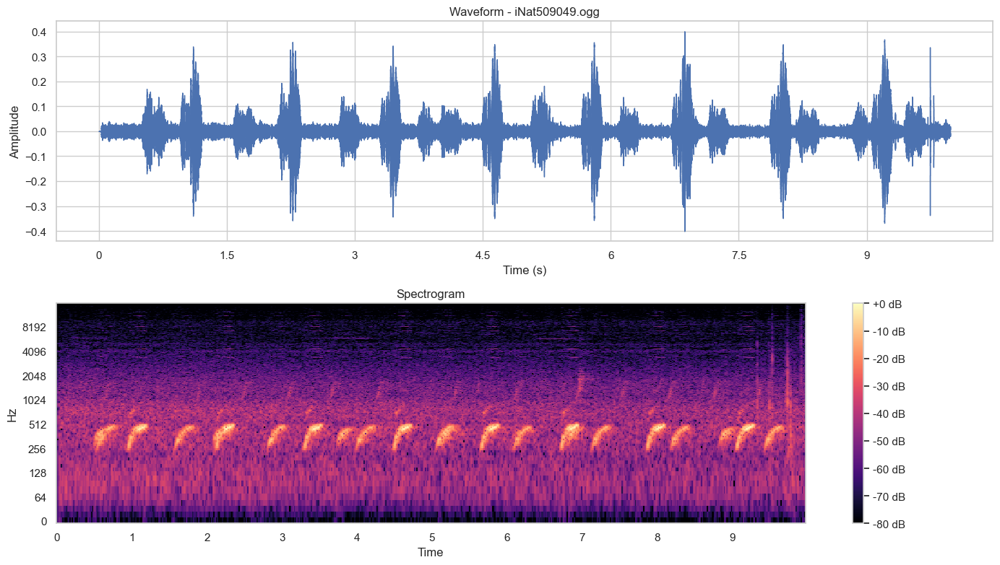

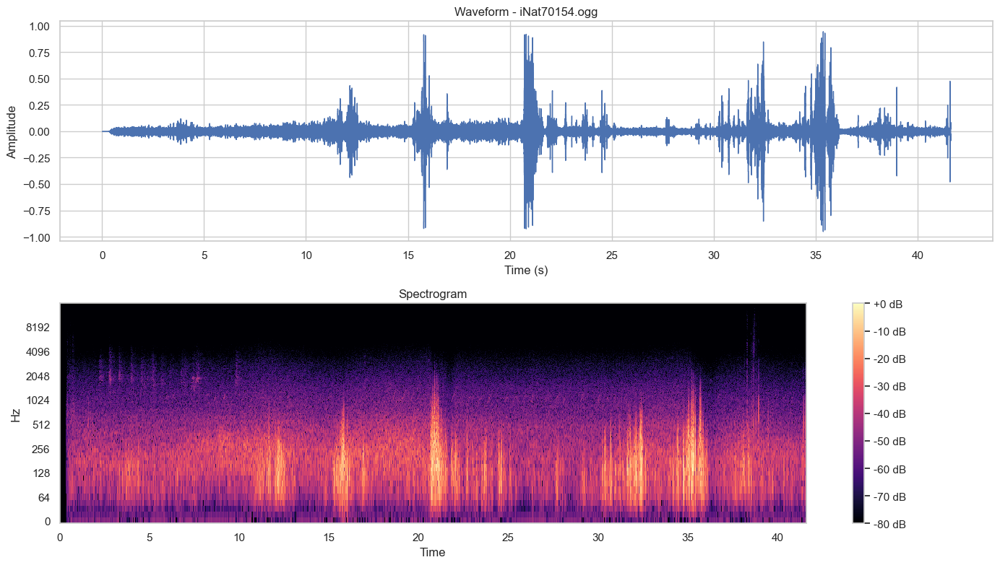

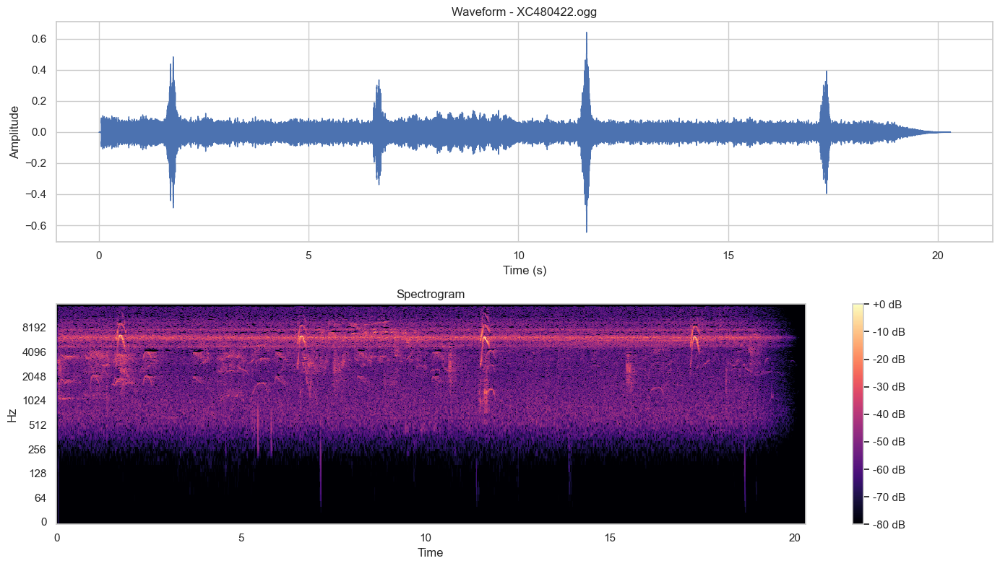

In [9]:
def load_and_visualize_audio(file_path):
    """Load an audio file and visualize its waveform and spectrogram."""
    y, sr = librosa.load(file_path, sr=None)
    
    duration = librosa.get_duration(y=y, sr=sr)
    
    plt.figure(figsize=(14, 8))
    
    # Plot waveform
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {os.path.basename(file_path)}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    
    # Plot spectrogram
    plt.subplot(2, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.tight_layout()
    
    return y, sr, duration

# Select a few random audio files for different classes
random.seed(42)  # For reproducibility

# Get sample files for each class
class_examples = {}
for class_name in taxonomy_df['class_name'].unique():
    class_ids = taxonomy_df[taxonomy_df['class_name'] == class_name]['primary_label'].tolist()
    class_files = train_df[train_df['primary_label'].isin(class_ids)]['filename'].sample(min(3, train_df[train_df['primary_label'].isin(class_ids)].shape[0])).tolist()
    class_examples[class_name] = class_files

# Visualize one example from each class
for class_name, file_list in class_examples.items():
    if file_list:
        print(f"\nVisualizing audio for class: {class_name}")
        file_path = os.path.join('train_audio', file_list[0])
        
        if os.path.exists(file_path):
            try:
                y, sr, duration = load_and_visualize_audio(file_path)
                print(f"Audio duration: {duration:.2f} seconds, Sample rate: {sr} Hz")
                
                # Display audio player
                print("Audio player:")
                display(ipd.Audio(y, rate=sr))
            except Exception as e:
                print(f"Error loading audio: {e}")
        else:
            print(f"File not found: {file_path}")

# Secondary Labels Analysis
* Let's analyze the secondary labels in the dataset.

Number of recordings with secondary labels: 28539 (99.91%)

Top 10 most common secondary species:
grekis: 489
whtdov: 309
trokin: 188
soulap1: 114
pirfly1: 112
rugdov: 110
banana: 104
saffin: 102
yebela1: 96
blbgra1: 88


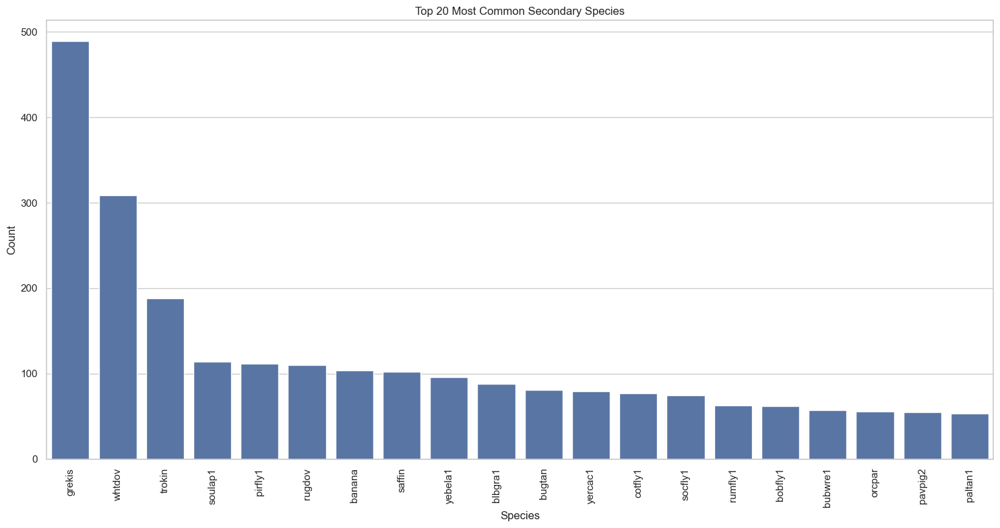

In [10]:
# Convert string representation of lists to actual lists
train_df['secondary_labels'] = train_df['secondary_labels'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Count recordings with secondary labels
has_secondary = train_df['secondary_labels'].apply(lambda x: len(x) > 0 if isinstance(x, list) else False)
print(f"Number of recordings with secondary labels: {has_secondary.sum()} ({has_secondary.sum() / len(train_df) * 100:.2f}%)")

# Flatten the list of secondary labels
all_secondary = []
for labels in train_df['secondary_labels']:
    if isinstance(labels, list) and len(labels) > 0:
        all_secondary.extend([label for label in labels if label])

# Most common secondary species
secondary_counts = Counter(all_secondary)
print("\nTop 10 most common secondary species:")
for species, count in secondary_counts.most_common(10):
    print(f"{species}: {count}")

# Visualize top secondary species
plt.figure(figsize=(15, 8))
top_secondary = pd.Series(secondary_counts).sort_values(ascending=False).head(20)
sns.barplot(x=top_secondary.index, y=top_secondary.values)
plt.title('Top 20 Most Common Secondary Species')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Audio Duration Analysis
* Let's analyze the duration of the audio recordings.

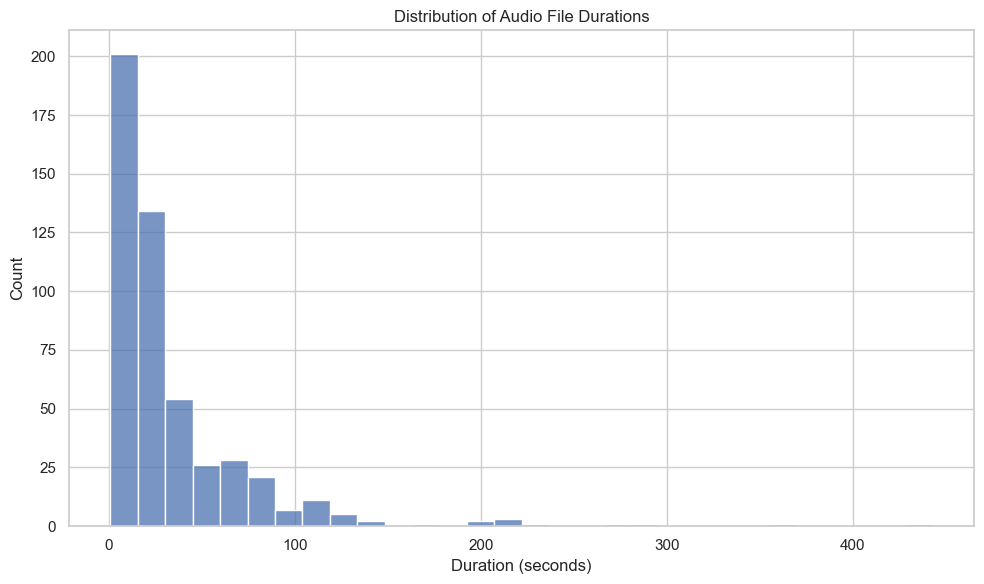

Average duration: 34.97 seconds
Median duration: 20.66 seconds
Min duration: 0.88 seconds
Max duration: 443.04 seconds


In [11]:
def get_audio_duration(file_path):
    """Get the duration of an audio file."""
    y, sr = librosa.load(file_path, sr=None)
    return librosa.get_duration(y=y, sr=sr)

# Sample a subset of files to analyze duration
sample_size = min(500, len(train_df))
sampled_files = train_df['filename'].sample(sample_size, random_state=42).tolist()

durations = []
for file in sampled_files:
    file_path = os.path.join('train_audio', file)
    if os.path.exists(file_path):
        durations.append(get_audio_duration(file_path))
    else:
        print(f"File not found: {file_path}")

# Plot the distribution of audio durations
plt.figure(figsize=(10, 6))
sns.histplot(durations, bins=30)
plt.title('Distribution of Audio File Durations')
plt.xlabel('Duration (seconds)')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

print(f"Average duration: {np.mean(durations):.2f} seconds")
print(f"Median duration: {np.median(durations):.2f} seconds")
print(f"Min duration: {np.min(durations):.2f} seconds")
print(f"Max duration: {np.max(durations):.2f} seconds")

# Species Correlation Analysis
* Let's check if certain species tend to co-occur in recordings.

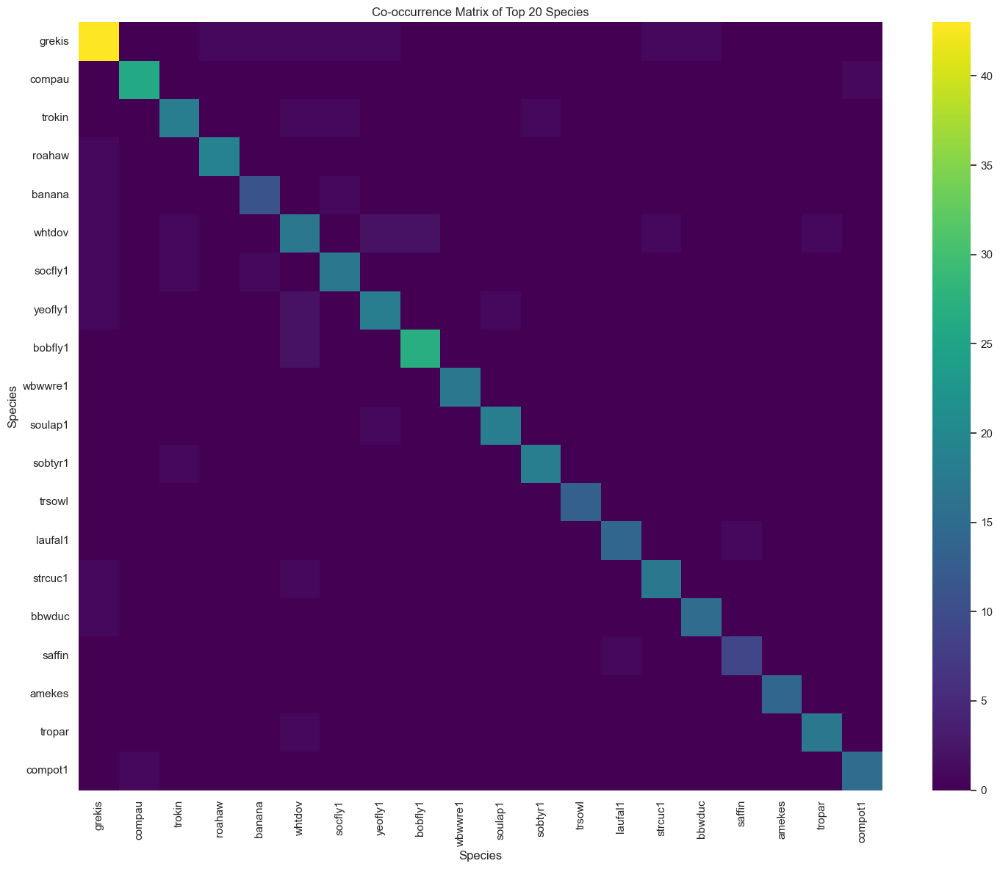

In [12]:
# Create a co-occurrence matrix for species that appear together in recordings
def create_cooccurrence_matrix(df):
    """Create a co-occurrence matrix of primary and secondary species."""
    all_species = set(df['primary_label'].unique())
    for secondary in df['secondary_labels']:
        if isinstance(secondary, list):
            all_species.update(secondary)
    
    # Remove empty strings
    all_species = {s for s in all_species if s}
    
    # Initialize co-occurrence matrix
    cooccur_matrix = pd.DataFrame(0, index=list(all_species), columns=list(all_species))
    
    # Fill matrix
    for _, row in df.iterrows():
        primary = row['primary_label']
        cooccur_matrix.at[primary, primary] += 1
        
        if isinstance(row['secondary_labels'], list):
            for secondary in row['secondary_labels']:
                if secondary:  # Skip empty strings
                    cooccur_matrix.at[primary, secondary] += 1
                    cooccur_matrix.at[secondary, primary] += 1
    
    return cooccur_matrix

# Sample a subset for the co-occurrence matrix to avoid memory issues
sample_df = train_df.sample(min(1000, len(train_df)), random_state=42)
cooccur_matrix = create_cooccurrence_matrix(sample_df)

# Get top co-occurring species
top_n = 20
top_species = train_df['primary_label'].value_counts().head(top_n).index
cooccur_subset = cooccur_matrix.loc[top_species, top_species]

# Plot the co-occurrence heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(cooccur_subset, annot=False, cmap='viridis')
plt.title(f'Co-occurrence Matrix of Top {top_n} Species')
plt.xlabel('Species')
plt.ylabel('Species')
plt.tight_layout()
plt.show()

# Conclusion and Next Steps
* Let's summarize our findings and outline potential next steps for the modeling phase.

In [13]:
# Summary and findings
print("Summary of the BirdCLEF 2023 Dataset:")
print(f"- Total number of recordings: {len(train_df)}")
print(f"- Number of unique species: {train_df['primary_label'].nunique()}")
print(f"- Classes of species: {', '.join(taxonomy_df['class_name'].unique())}")
print(f"- Number of recordings with secondary labels: {has_secondary.sum()} ({has_secondary.sum() / len(train_df) * 100:.2f}%)")

print("\nKey insights:")
print("1. The dataset contains recordings of multiple biological classes, including birds, amphibians, mammals, and insects.")
print("2. There is significant class imbalance, with some species having many more recordings than others.")
print("3. The recordings come from various collections (XC, iNat, CSA) and have varying quality ratings.")
print("4. The recordings have different durations, which will need to be standardized for modeling.")
print("5. Secondary labels indicate that multiple species can be present in a single recording.")

print("\nNext steps for modeling:")
print("1. Preprocess audio files: standardize duration, sample rate, and convert to spectrograms.")
print("2. Handle class imbalance through data augmentation or weighted loss functions.")
print("3. Build models that can detect multiple species in a single recording (multi-label classification).")
print("4. Incorporate geographic information if relevant for predictions.")
print("5. Consider ensemble approaches to combine predictions from multiple models.")

Summary of the BirdCLEF 2023 Dataset:
- Total number of recordings: 28564
- Number of unique species: 206
- Classes of species: Insecta, Amphibia, Mammalia, Aves
- Number of recordings with secondary labels: 28539 (99.91%)

Key insights:
1. The dataset contains recordings of multiple biological classes, including birds, amphibians, mammals, and insects.
2. There is significant class imbalance, with some species having many more recordings than others.
3. The recordings come from various collections (XC, iNat, CSA) and have varying quality ratings.
4. The recordings have different durations, which will need to be standardized for modeling.
5. Secondary labels indicate that multiple species can be present in a single recording.

Next steps for modeling:
1. Preprocess audio files: standardize duration, sample rate, and convert to spectrograms.
2. Handle class imbalance through data augmentation or weighted loss functions.
3. Build models that can detect multiple species in a single record

The notebook provides a solid foundation for understanding the dataset's characteristics and challenges before moving to the model development phase.